In [67]:
# importing packages
import numpy as np
import matplotlib.pyplot as plt

from scipy.optimize import curve_fit
from scipy.special import expit

import ssm
from ssm import transitions 

import scipy.io
import os
import pandas as pd
import seaborn as sns
import glmhmmFunctions as ghf


In [68]:
# load data
filename = '/Users/mpexirra/Documents/data/muscimoldata'
data = scipy.io.loadmat(filename)
data = data['muscimoldata']

In [69]:
# save data
savepath = '/Users/mpexirra/Documents/data/newplots/'

In [70]:
# defining plot colors
stimcolors = sns.color_palette("rocket_r")
colors = ['gold', 'plum', 'lightskyblue', 'red']

In [71]:
# all data as a data frame
df = pd.DataFrame(data)
df.columns = ['animal', 'sessionid', 'trialnumber', 'trial_block', 'lotterymag', 'lotteryprob', 
           'surebetmag', 'rewardreceived', 'lotterychoice', 'lotteryoutcome', 'musdose', 'region']

In [72]:
# adding/modifying relevant variables to data frame
df.animal = df.animal.astype(int)

df['choiceout'] = np.zeros(len(df))
df.loc[(df.lotterychoice == 1) & (df.lotteryoutcome == 1),['choiceout']] = 1
df.loc[(df.lotterychoice == 1) & (df.lotteryoutcome == 0),['choiceout']] = -1

df.loc[df.region == 1, 'region'] = 'ctrl'
df.loc[df.region == 2, 'region'] = 'fof'
df.loc[df.region == 3, 'region'] = 'ppc'

In [73]:
# defining other data frames with more specific data
dfmus = df[df.musdose != 0]
dfctrl = df[df.region == 'ctrl']
dfmanipulation = df[df.region != 'ctrl']

In [280]:
# defining glm-hmm main parameters
maxstates = 5
inputdim = 2
obsdim = 1
ncategories = 2
nEMiterations = 300
dataframe2test = df
animals = dataframe2test.animal.unique()
nanimals = len(animals)

In [281]:
# check optimal number of states
LLstates = ghf.nstatesFit(dataframe2test, maxstates, obsdim, inputdim, ncategories, nEMiterations)

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

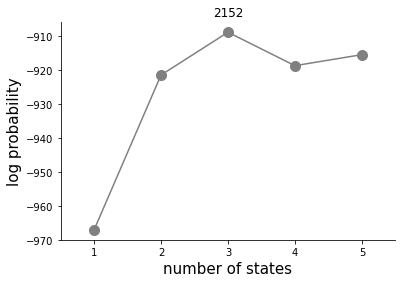

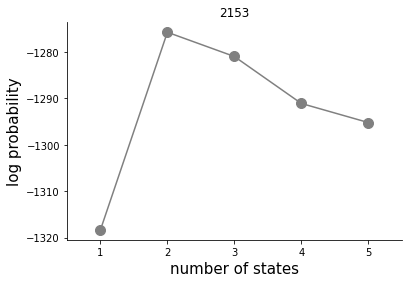

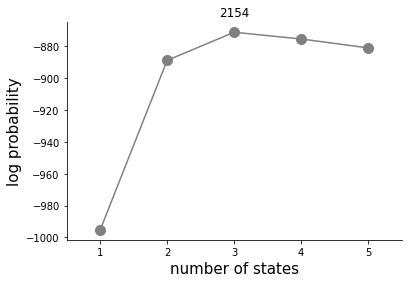

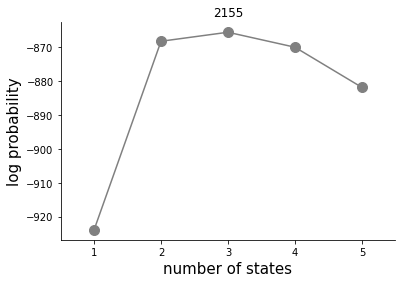

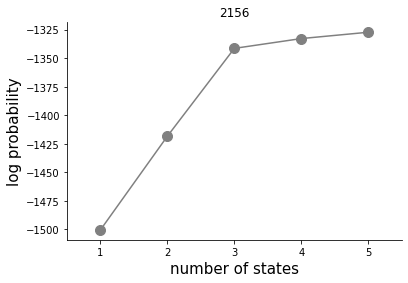

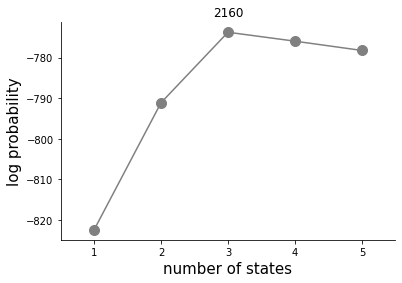

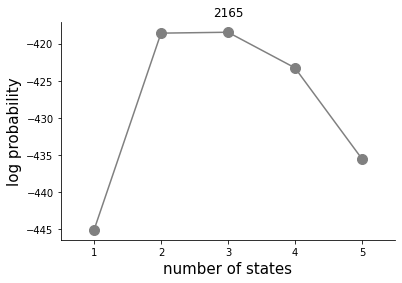

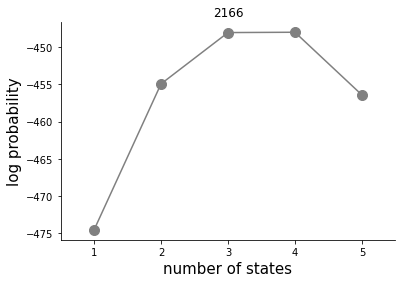

In [282]:
# plotting likelihoods per state 
animals = df['animal'].unique()
nanimals = np.shape(LLstates)[0]
nmaxstates = np.shape(LLstates)[1]

xx = np.arange(nmaxstates) + 1
for aa in range(nanimals):
    fig, ax = plt.subplots(1,1)

    plt.plot(xx, LLstates[aa,:], marker = 'o', markersize = 10, color = 'gray', linestyle = '-')

    # axis options
    plt.title(animals[aa])
    plt.xlabel('number of states', fontsize = 15)
    plt.xlim(.5, nmaxstates + .5)
    plt.ylabel('log probability', fontsize = 15)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    #saving figures
    datasetname = 'all'
    path = savepath + datasetname + '/modelfit/'
    filename = str(animals[aa]) + '_' + str(datasetname) + '_modelfit.png'
    plt.savefig(path + filename, dpi = 300, facecolor = 'white') 


In [284]:
# getting glmhmm parameters
nstates = ghf.nstatesOptimal(LLstates)[0][0]
inputs = ghf.ssmRestructure(dataframe2test, inputdim)[0]
Y = ghf.ssmRestructure(dataframe2test, inputdim)[1]
statestr, _ = ghf.addState2df(dataframe2test, nstates)


3

In [285]:
# train glmhmm
w, transmat, dataframe2test = ghf.runGLMHMM(dataframe2test, nstates, obsdim, inputdim, ncategories, nEMiterations)

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

/var/folders/cg/jhwhw7qn5gl9_pb586p8cmf80000gp/T/ipykernel_73961/2847657658.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1, figsize = (15,5))


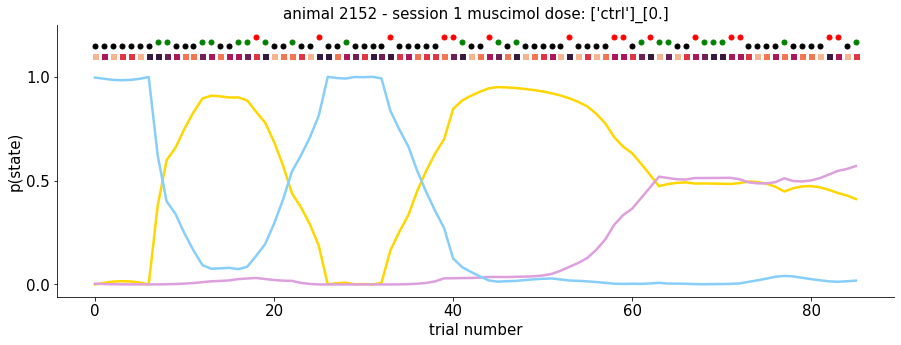

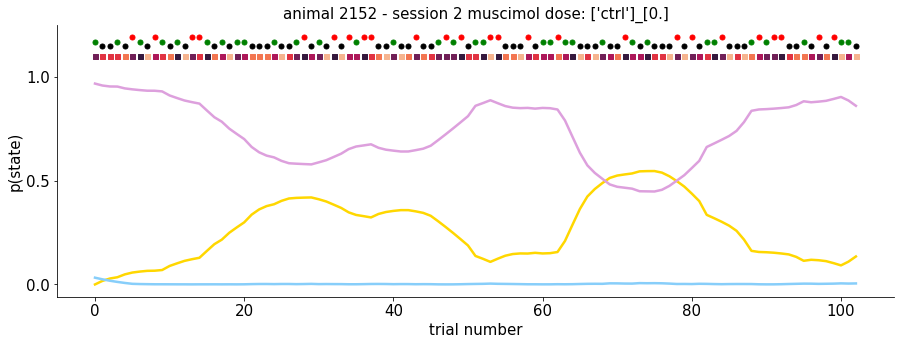

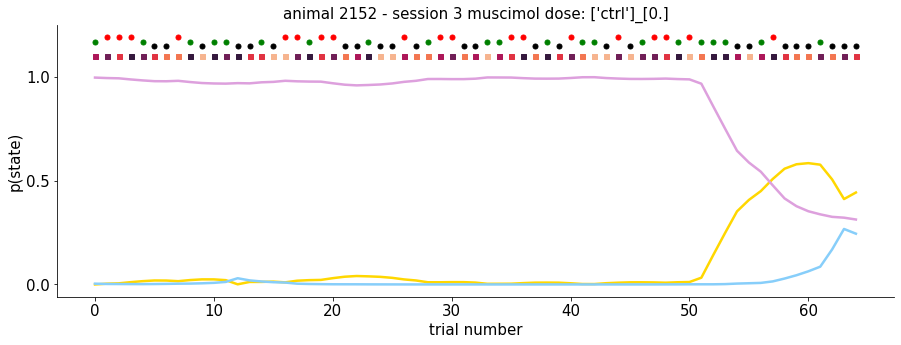

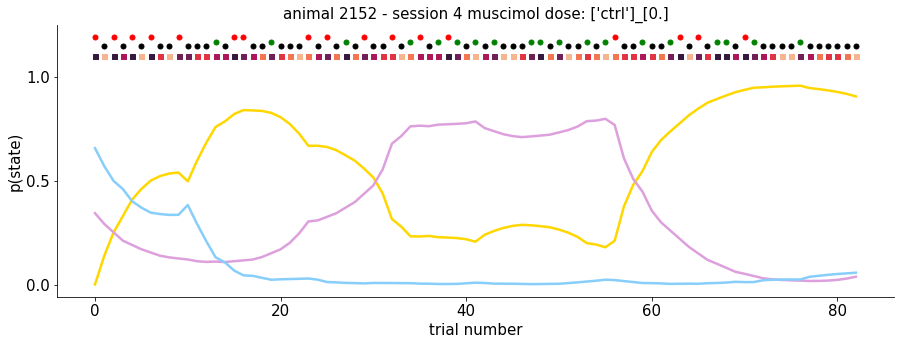

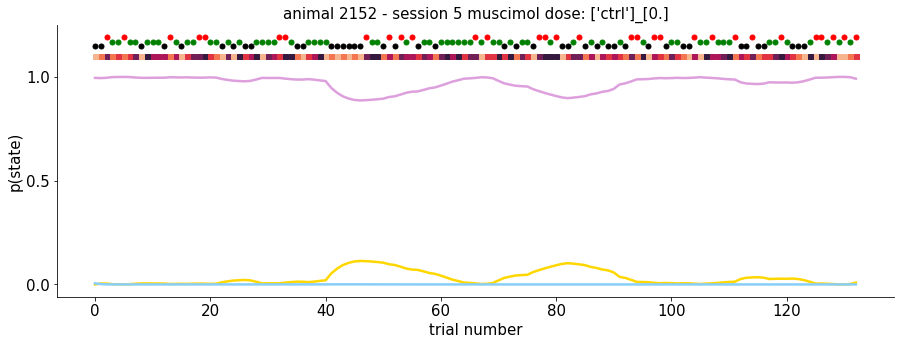

...

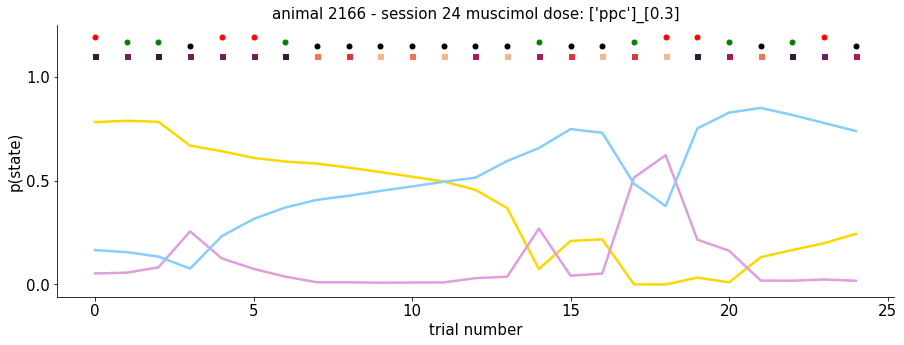

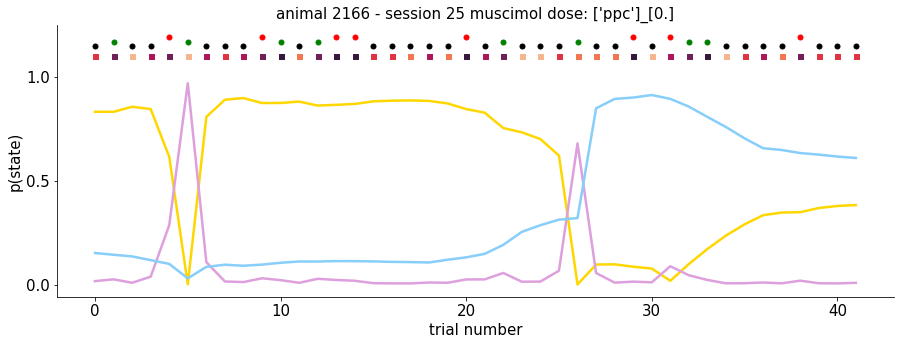

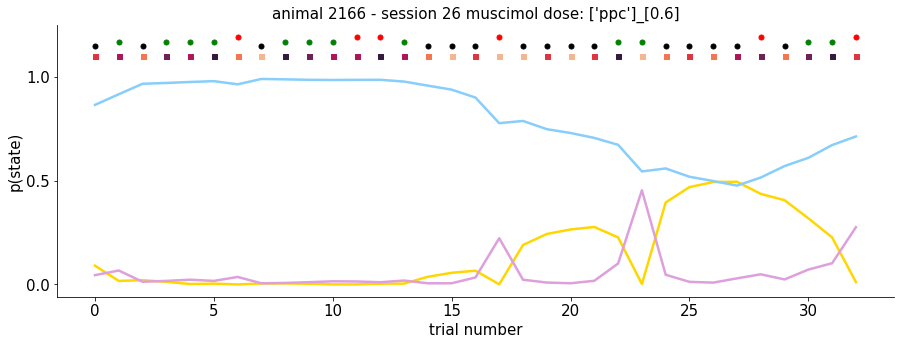

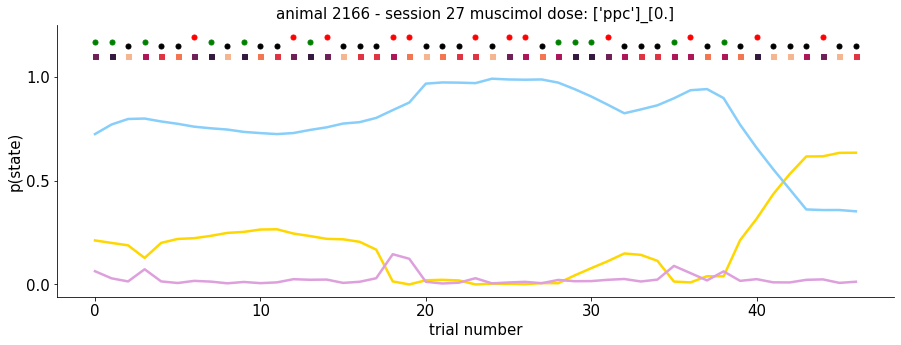

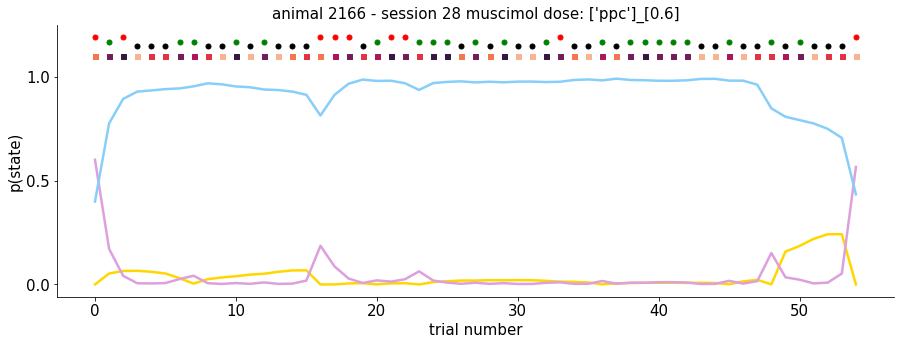

In [286]:
# session summaries
for aa in range(nanimals):
    animaldata = dataframe2test[dataframe2test.animal == animals[aa]]
    sessions = animaldata.sessionid.unique()
    nsessions = len(sessions)
    
    for ss in range(nsessions):
        fig, ax = plt.subplots(1,1, figsize = (15,5))
        
        # getting session data
        sessiondata = animaldata[animaldata.sessionid == sessions[ss]]
        ntrials = len(sessiondata)
        lotteryoffer = np.array(sessiondata.lotterymag)
        lotteryofferset = np.unique(lotteryoffer)
        lotteryoutcome = np.array(sessiondata.choiceout)

        ## plotting p(state)
        plt.plot(range(ntrials), sessiondata.pstate1, color = colors[0], lw = 2.5)
        plt.plot(range(ntrials), sessiondata.pstate2, color = colors[1], lw = 2.5)
        plt.plot(range(ntrials), sessiondata.pstate3, color = colors[2], lw = 2.5)
        
        ## plotting trial type
        for tt in range(ntrials):
            # scatter lottery offer
            stimidx = np.where(lotteryoffer[tt] == lotteryofferset)[0][0]
            plt.scatter(tt, 1.1, marker = 's', color = stimcolors[stimidx], s = 25)
            
            # scatter lottery outcome
            if lotteryoutcome[tt] == 0:
                plt.scatter(tt, 1.15, marker = 'o', color = 'k', s = 25)
            elif lotteryoutcome[tt] == 1:
                plt.scatter(tt, 1.17, marker = 'o', color = 'g', s = 25)
            elif lotteryoutcome[tt] == -1:
                plt.scatter(tt, 1.19, marker = 'o', color = 'r', s = 25)
        
        # axis options
        plt.title('animal ' + str(animals[aa]) + ' - session ' + str(ss + 1) + 
                  ' muscimol dose: ' + str(sessiondata.region.unique()) + '_' + str(sessiondata.musdose.unique()), fontsize = 15)
        plt.xlabel('trial number',  fontsize = 15)  
        plt.ylabel('p(state)', fontsize = 15)
        ax.set_yticks([0, .5, 1])
        plt.xticks(fontsize = 15)
        plt.yticks(fontsize = 15)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
    
        #saving figures
        datasetname = 'all'
        path = savepath + datasetname + '/animalsummaries/'
        filename = str(animals[aa]) + '_' + str(datasetname) + '_session' + str(ss + 1) + ' muscimol dose: ' + str(sessiondata.region.unique()) + '_' + str(sessiondata.musdose.unique()) + '.png'
        plt.savefig(path + filename, dpi = 300, facecolor = 'white') 
          



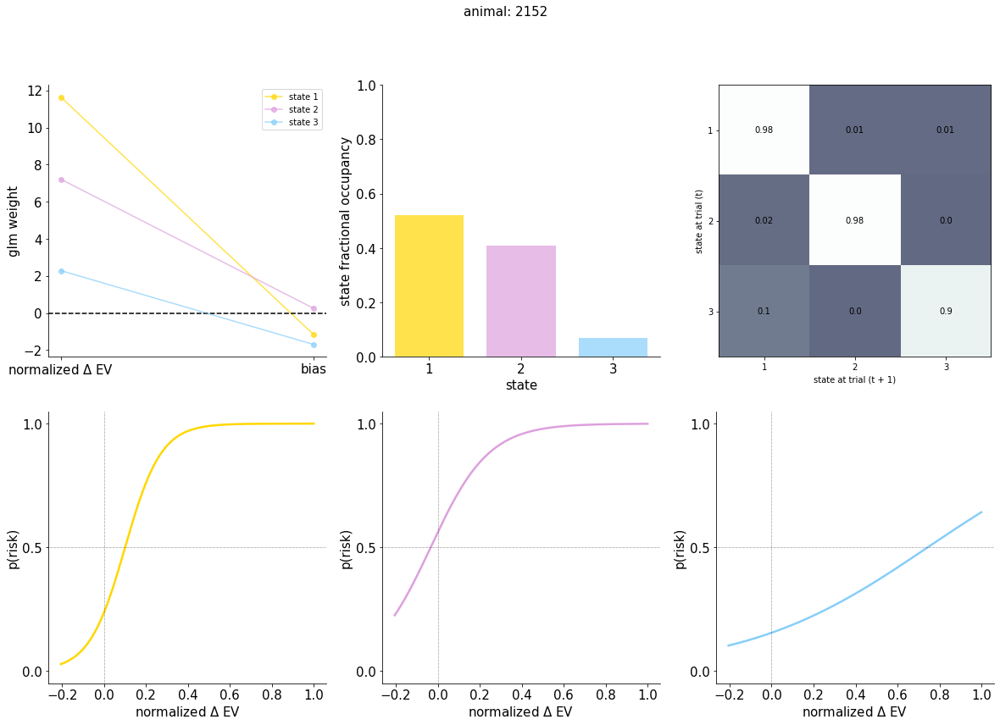

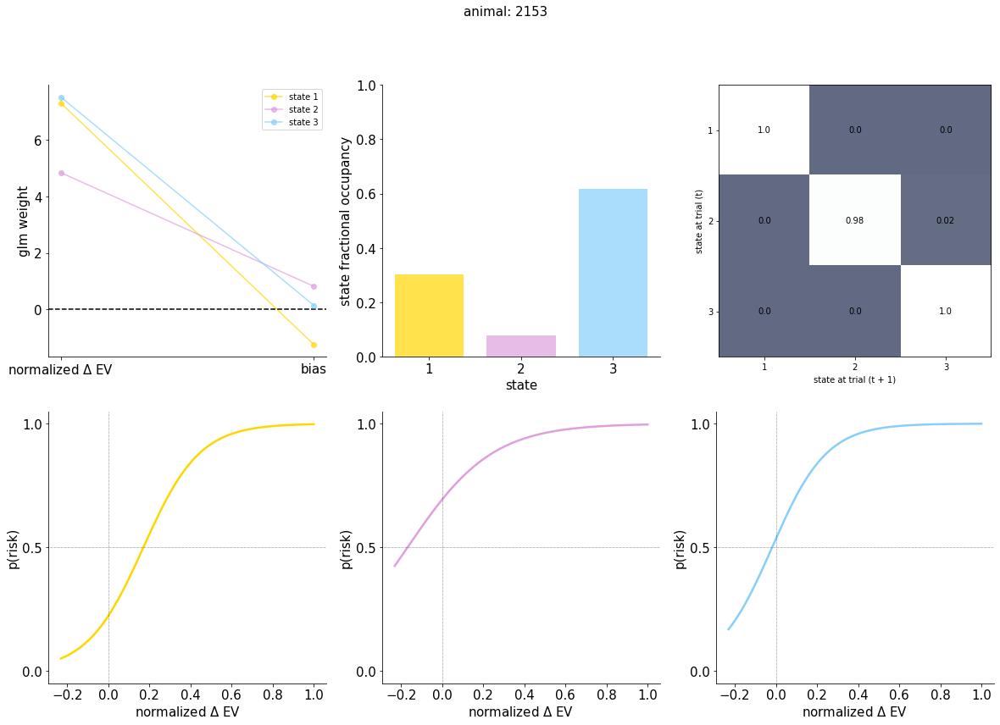

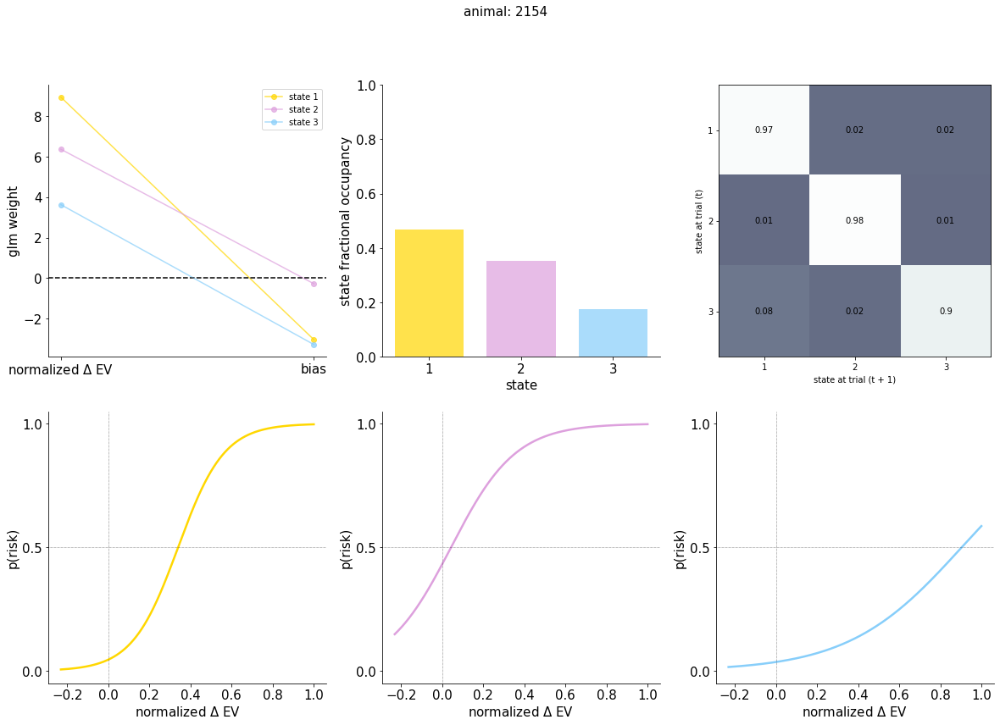

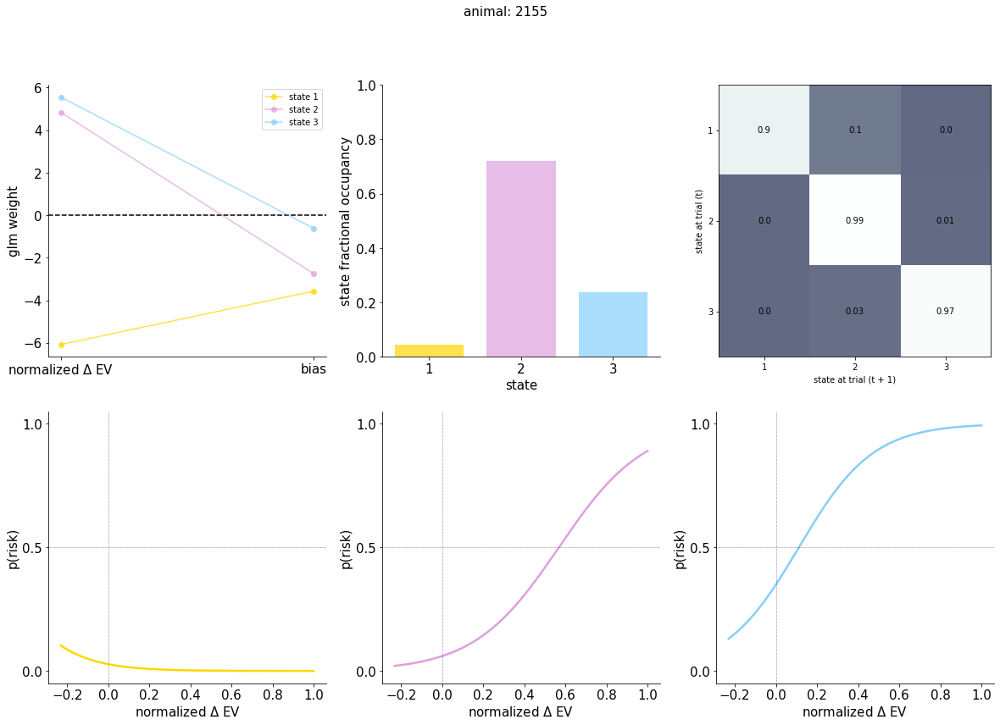

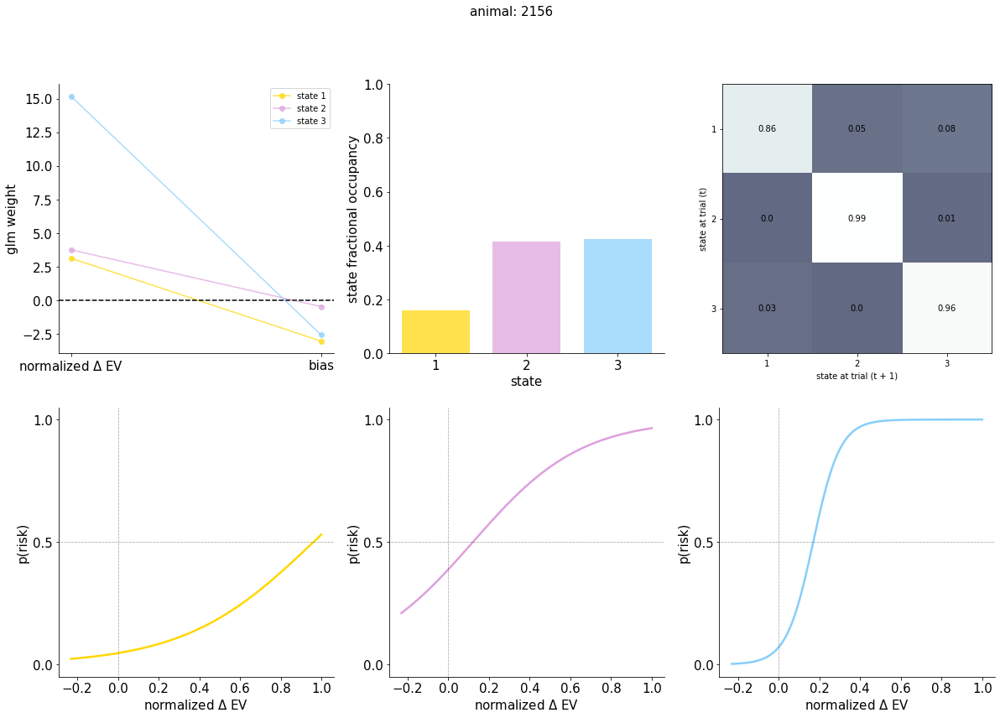

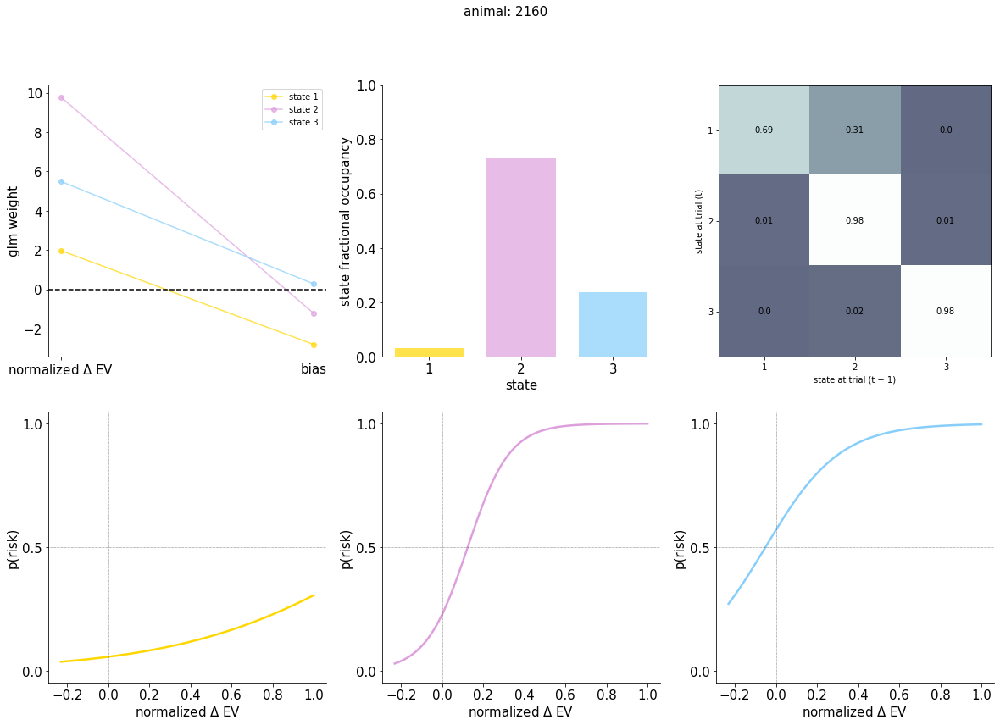

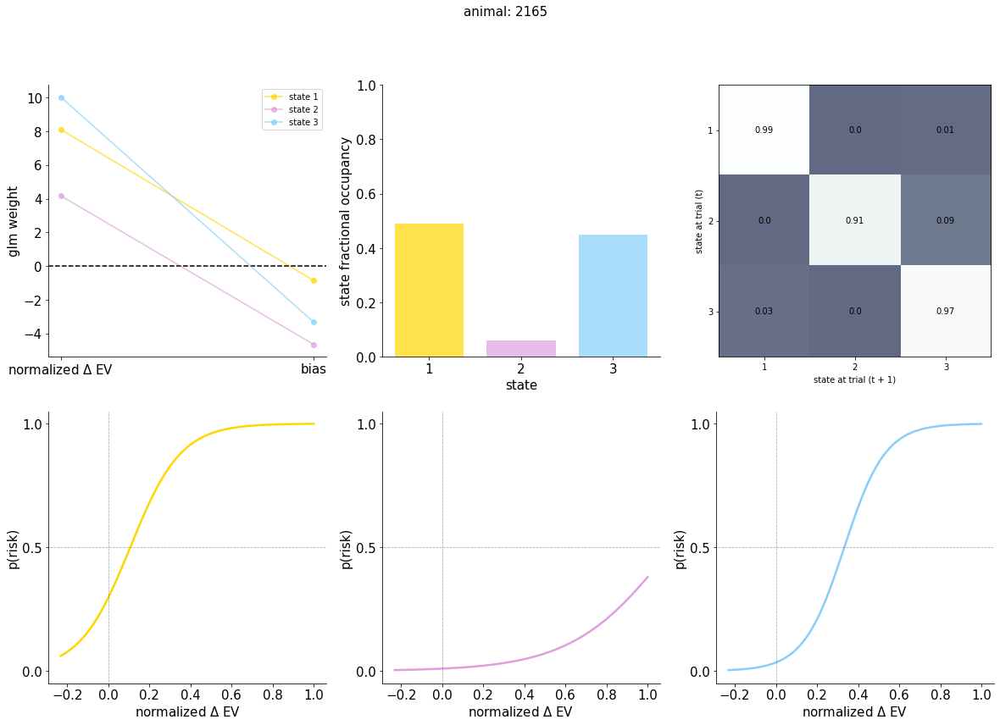

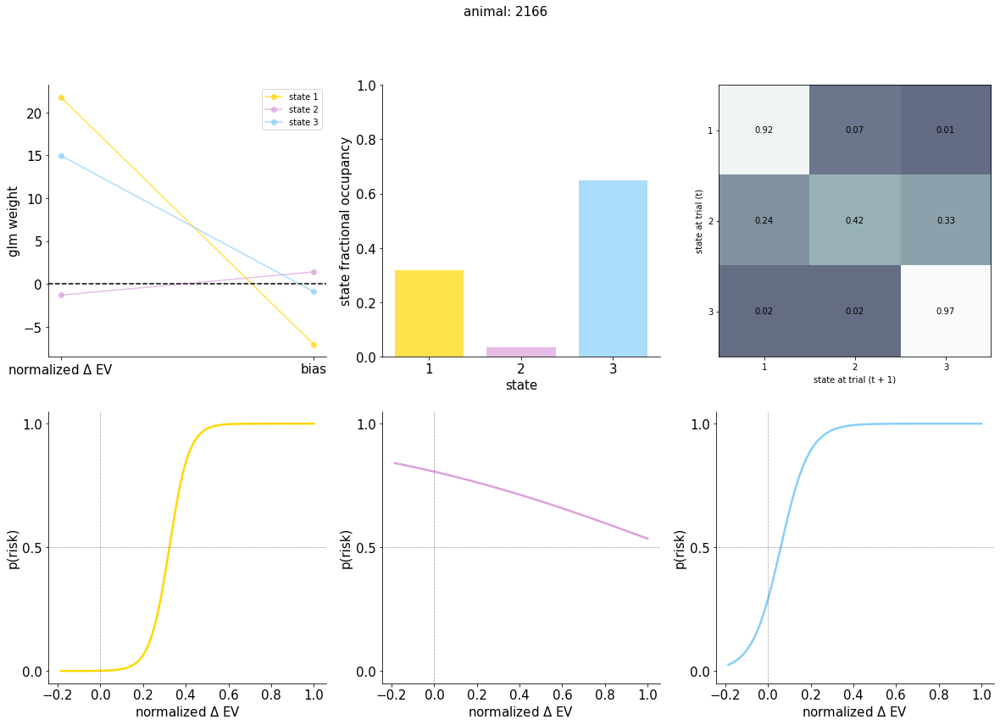

In [287]:
# plot glmhmm animal summaries
for aa in range(nanimals):
    fig, ax = plt.subplots(2, 3, figsize = (20,13))
    fig.suptitle('animal: ' + str(animals[aa]), fontsize = 15)
    
    # getting animal data
    animaldata = dataframe2test[dataframe2test.animal == animals[aa]]
    evs = np.unique(inputs[aa][0][:,0])
    evspace = np.linspace(np.min(evs), np.max(evs), 1000)
    X = np.array([
        evspace,
        np.repeat(1, len(evspace))]).T
    transitionmatrix = np.round(transmat[aa], 2)
    
    for kk in range(nstates):             
        glmweights = w[aa][kk, :]
        wX = np.matmul(X, glmweights)
        
        ## plot glm weights for each covariate
        plt.subplot(2, 3, 1)
        plt.plot(range(inputdim), glmweights, marker = 'o', 
                 color = colors[kk], alpha = .7, linestyle = '-', label = 'state ' + str(kk+1))
        
        # axis options
        plt.xticks(fontsize = 15)
        plt.yticks(fontsize = 15)
        plt.ylabel('glm weight', fontsize = 15)
        plt.xticks(range(inputdim), ['normalized $\Delta$ EV ', 'bias'],  fontsize = 15)
        plt.axhline(y = 0, color = 'k', alpha = .5, ls = '--')
        plt.legend()
        ax[0,0].spines['top'].set_visible(False)
        ax[0,0].spines['right'].set_visible(False)
        
        ## plot fractional occupancy
        plt.subplot(2, 3, 2)
        occ = sum(animaldata.state == statestr[kk])/len(animaldata)
        plt.bar(kk, occ, width = .75, color = colors[kk], alpha = .7)
        
        # axis options
        plt.ylim((0,1))
        plt.xticks(fontsize = 15)
        plt.yticks(fontsize = 15)
        plt.xlabel('state', fontsize = 15)  
        plt.ylabel('state fractional occupancy', fontsize = 15)
        plt.xticks([0,1,2], ['1','2','3'], fontsize = 15)
        ax[0,1].spines['top'].set_visible(False)
        ax[0,1].spines['right'].set_visible(False)
        
        ## plot transition matrix
        plt.subplot(2, 3, 3)
        plt.imshow(transitionmatrix, vmin = -.8, vmax = 1, cmap = 'bone')

        for jj in range(nstates):
            text = plt.text(jj, kk, str(transitionmatrix[kk, jj]), ha = 'center', va = 'center', color = 'k')

            plt.xlim(-.5, nstates - .5)
            plt.xticks(range(0, nstates), ('1', '2', '3'))
            plt.yticks(range(0, nstates), ('1', '2', '3'))
            plt.ylim(nstates - .5, -.5)
            plt.ylabel('state at trial (t)')
            plt.xlabel('state at trial (t + 1)')
    
        ## plot glm psycurves
        plt.subplot(2, 3, 3 + kk + 1)
        plt.plot(evspace, expit(wX), lw = 2.5, color = colors[kk])
        
        # reference lines
        plt.axvline(0, linestyle = ':', c = 'k',  lw = .5)
        plt.axhline(.5, linestyle = ':', c = 'k', lw = .5)
    
        # axis options
        plt.ylim((-.05, 1.05))
        plt.xlabel('normalized $\Delta$ EV',  fontsize = 15)  
        plt.ylabel('p(risk)', fontsize = 15)
        ax[1, kk].set_yticks([0, .5, 1])
        plt.xticks(fontsize = 15)
        plt.yticks(fontsize = 15)
        ax[1, kk].spines['top'].set_visible(False)
        ax[1, kk].spines['right'].set_visible(False)
    
     
        ##saving figures
        datasetname = 'all'
        path = savepath + datasetname + '/glmhmm/'
        filename = str(animals[aa]) + '_' + str(datasetname) + 'glmhmmsummary.png'
        plt.savefig(path + filename, dpi = 300, facecolor = 'white') 

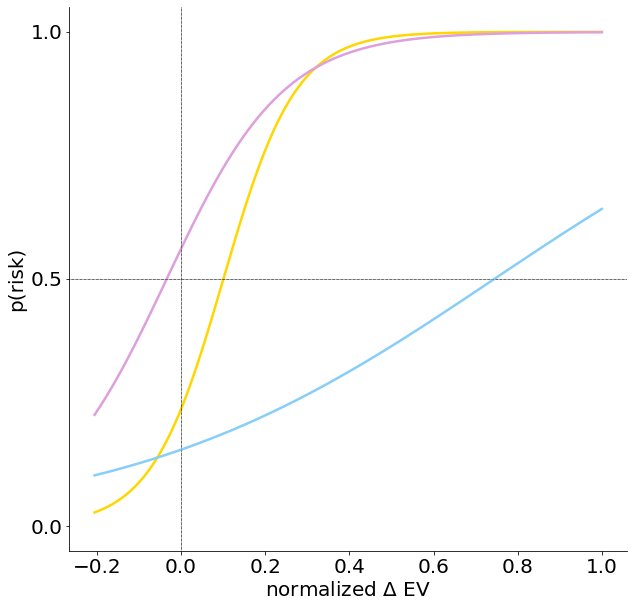

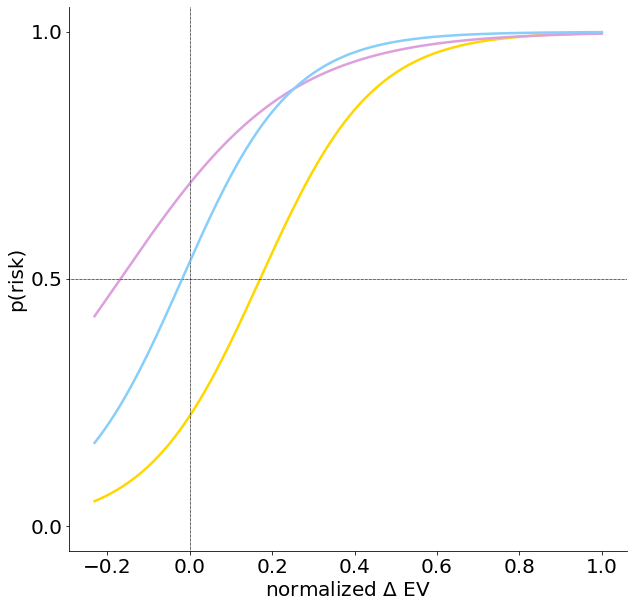

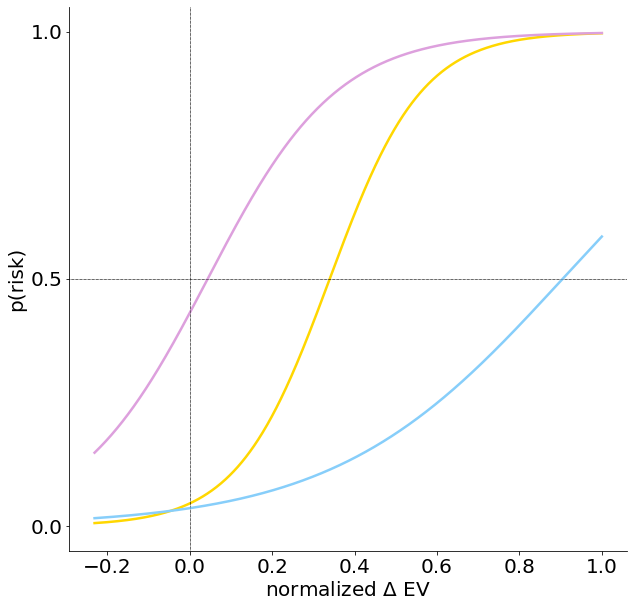

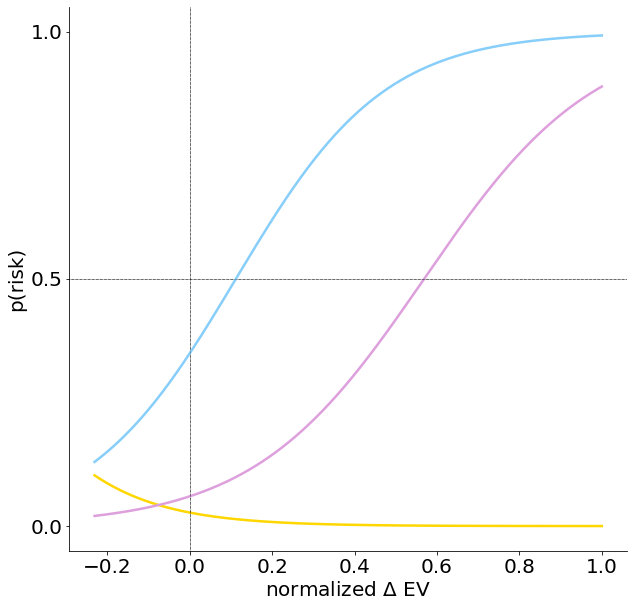

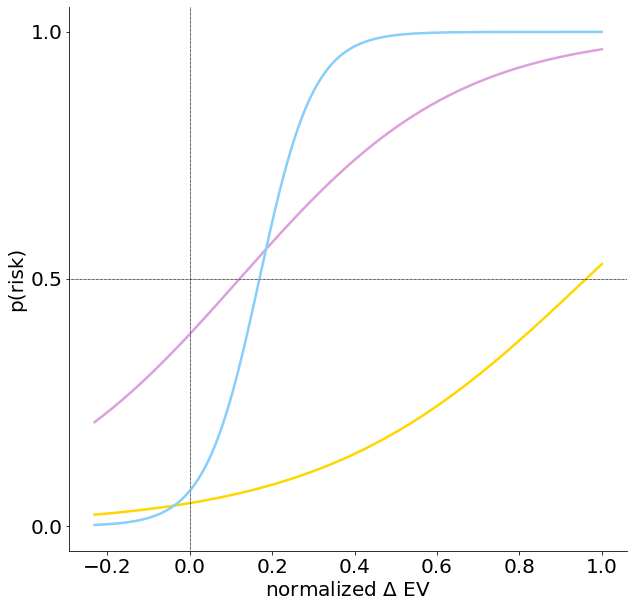

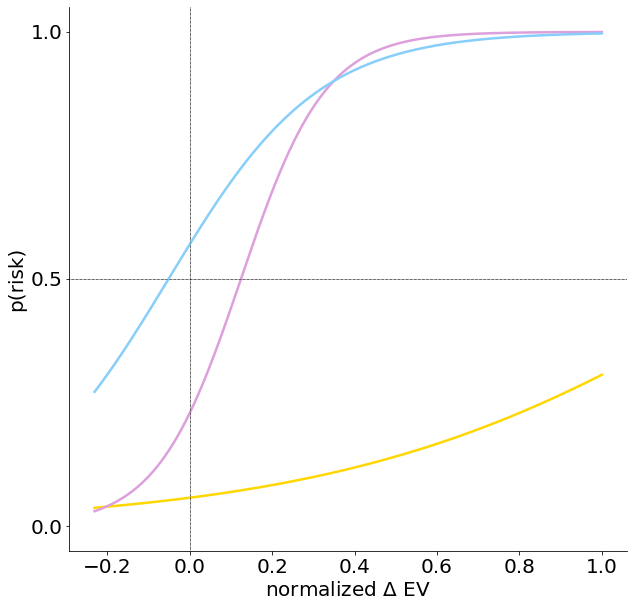

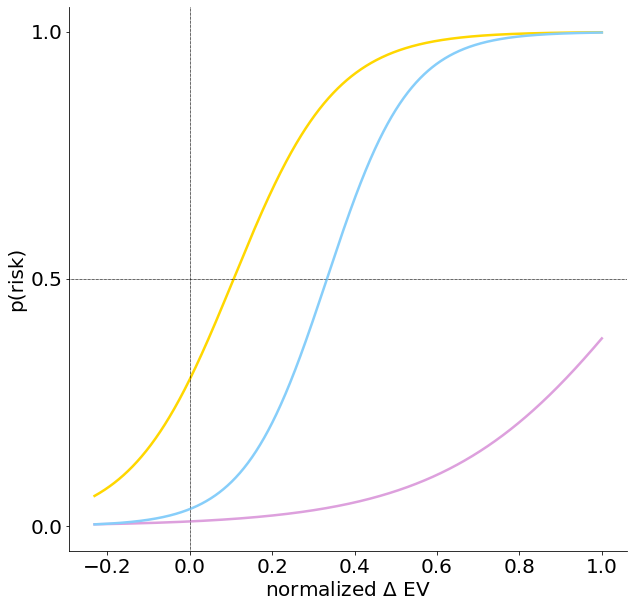

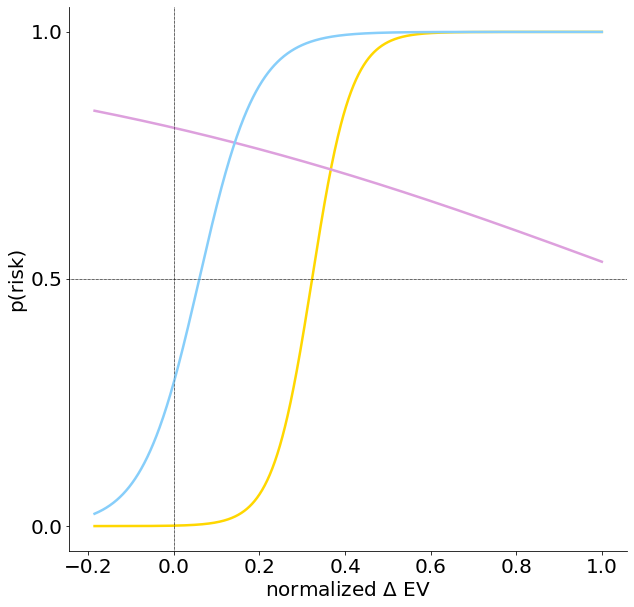

In [322]:
# plot glmhmm animal summaries
for aa in range(nanimals):
    fig, ax = plt.subplots(1, 1, figsize = (10,10))
  
    # getting animal data
    animaldata = dataframe2test[dataframe2test.animal == animals[aa]]
    evs = np.unique(inputs[aa][0][:,0])
    evspace = np.linspace(np.min(evs), np.max(evs), 1000)
    X = np.array([
        evspace,
        np.repeat(1, len(evspace))]).T
    transitionmatrix = np.round(transmat[aa], 2)
    
    for kk in range(nstates):             
        glmweights = w[aa][kk, :]
        wX = np.matmul(X, glmweights)
        
        # ## plot glm weights for each covariate
        # plt.plot(range(inputdim), glmweights, marker = 'o', lw = 3,
        #          color = colors[kk], alpha = .7, linestyle = '-', label = 'state ' + str(kk+1))
        
        # # axis options
        # plt.title(animals[aa])
        # plt.xticks(fontsize = 20)
        # plt.yticks(fontsize = 20)
        # plt.ylabel('glm weight', fontsize = 20)
        # plt.xticks(range(inputdim), ['normalized $\Delta$ EV ', 'bias'],  fontsize = 20)
        # plt.axhline(y = 0, color = 'k', alpha = .5, ls = '--')
        # plt.legend()
        # ax.spines['top'].set_visible(False)
        # ax.spines['right'].set_visible(False)
        
        # ##saving figures
        # datasetname = 'all'
        # path = savepath + datasetname + '/allplots/'
        # filename = str(animals[aa]) + '_' + str(datasetname) + '_glmweights.png'
        # plt.savefig(path + filename, dpi = 300, facecolor = 'white') 

        # ## plot fractional occupancy
        # occ = sum(animaldata.state == statestr[kk])/len(animaldata)
        # plt.bar(kk, occ, width = .75, color = colors[kk], alpha = .7)
        
        # # axis options
        # plt.ylim((0,1))
        # plt.xticks(fontsize = 15)
        # plt.yticks(fontsize = 15)
        # plt.xlabel('state', fontsize = 15)  
        # plt.ylabel('state fractional occupancy', fontsize = 15)
        # plt.xticks([0,1,2], ['1','2','3'], fontsize = 15)
        # ax.spines['top'].set_visible(False)
        # ax.spines['right'].set_visible(False)

        # ##saving figures
        # datasetname = 'all'
        # path = savepath + datasetname + '/allplots/'
        # filename = str(animals[aa]) + '_' + str(datasetname) + '_fractionaloccupation.png'
        # plt.savefig(path + filename, dpi = 300, facecolor = 'white') 
        
        # ## plot transition matrix
        # plt.imshow(transitionmatrix, vmin = -.8, vmax = 1, cmap = 'bone')

        # for jj in range(nstates):
        #     text = plt.text(jj, kk, str(transitionmatrix[kk, jj]), ha = 'center', va = 'center', color = 'k', fontsize = 20)

        #     plt.xlim(-.5, nstates - .5)
        #     plt.xticks(range(0, nstates), ('1', '2', '3'), fontsize = 20)
        #     plt.yticks(range(0, nstates), ('1', '2', '3'), fontsize = 20)
        #     plt.ylim(nstates - .5, -.5)
        #     plt.ylabel('state at trial (t)', fontsize = 20)
        #     plt.xlabel('state at trial (t + 1)', fontsize = 20)

        # ##saving figures
        # datasetname = 'all'
        # path = savepath + datasetname + '/allplots/'
        # filename = str(animals[aa]) + '_' + str(datasetname) + '_transitionmatrix.png'
        # plt.savefig(path + filename, dpi = 300, facecolor = 'white') 
    
        ## plot glm psycurves
        plt.plot(evspace, expit(wX), lw = 2.5, color = colors[kk])
        
        # reference lines
        plt.axvline(0, linestyle = ':', c = 'k',  lw = .5)
        plt.axhline(.5, linestyle = ':', c = 'k', lw = .5)
    
        # axis options
        plt.ylim((-.05, 1.05))
        plt.xlabel('normalized $\Delta$ EV',  fontsize = 20)  
        plt.ylabel('p(risk)', fontsize = 20)
        ax.set_yticks([0, .5, 1])
        plt.xticks(fontsize = 20)
        plt.yticks(fontsize = 20)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        ##saving figures
        datasetname = 'all'
        path = savepath + datasetname + '/allplots/'
        filename = str(animals[aa]) + '_' + str(datasetname) + '_psycurves.png'
        plt.savefig(path + filename, dpi = 300, facecolor = 'white') 
    
     

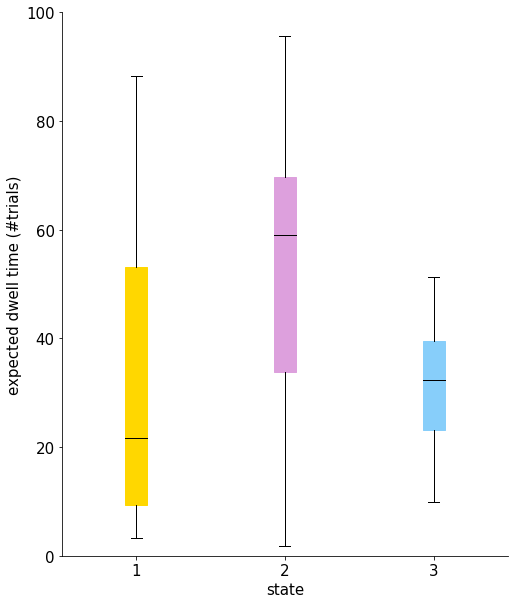

In [292]:
# dwell times   
fig, ax = plt.subplots(1,1,figsize= (8,10))
for kk in range(nstates):
   diags = np.array([matrix[kk][kk] for matrix in transmat])
   dwell = 1 / (1 - diags)
   plt.boxplot(dwell, positions = [kk+1], patch_artist = True, 
   boxprops=dict(facecolor = colors[kk], color = colors[kk]),
            capprops=dict(color='k'),
            whiskerprops=dict(color='k'),
            flierprops=dict(color='w', markeredgecolor='w'),
            medianprops=dict(color='k'),
            )

   # axis options         
   plt.ylim(0,100)
   plt.xlabel('state',  fontsize = 15)  
   plt.ylabel('expected dwell time (#trials)', fontsize = 15)
   plt.xticks(fontsize = 15)
   plt.yticks(fontsize = 15)
   ax.spines['top'].set_visible(False)
   ax.spines['right'].set_visible(False)

   ##saving figures
   datasetname = 'all'
   path = savepath + datasetname + '/allplots/'
   filename = str(str(datasetname) + '_dwelltimes.png')
   plt.savefig(path + filename, dpi = 300, facecolor = 'white') 

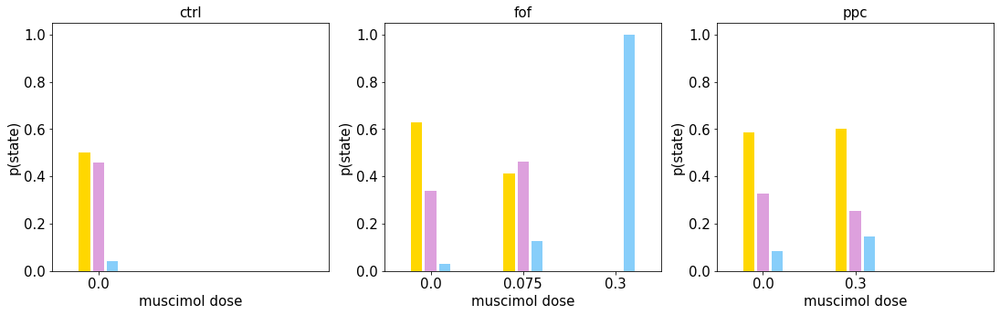

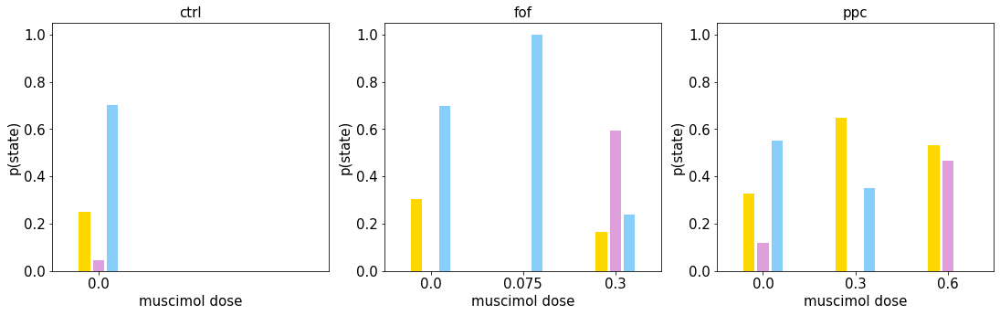

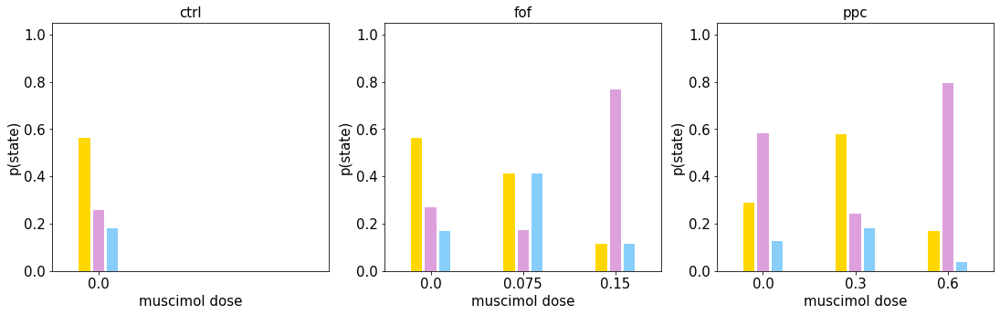

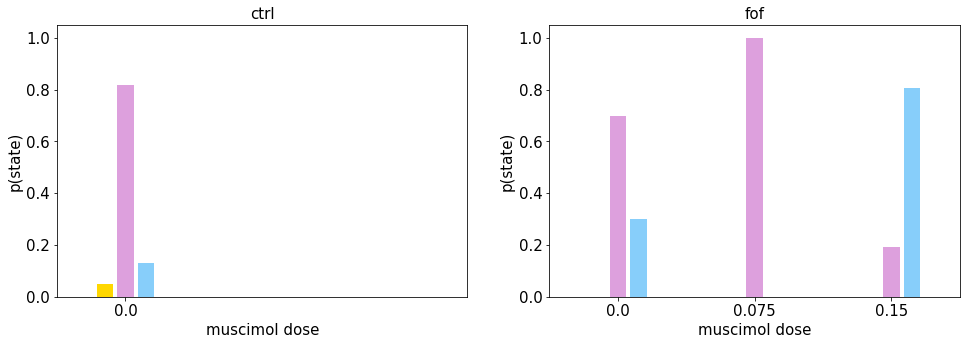

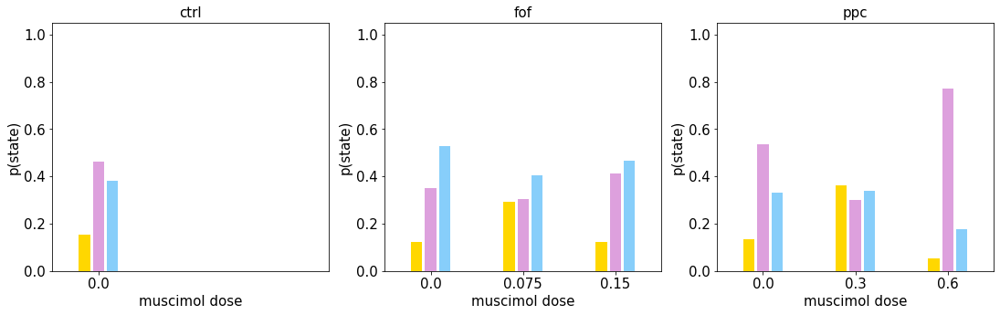

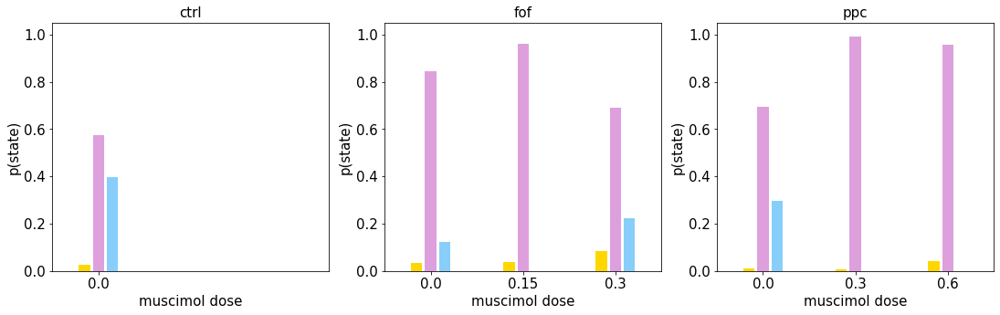

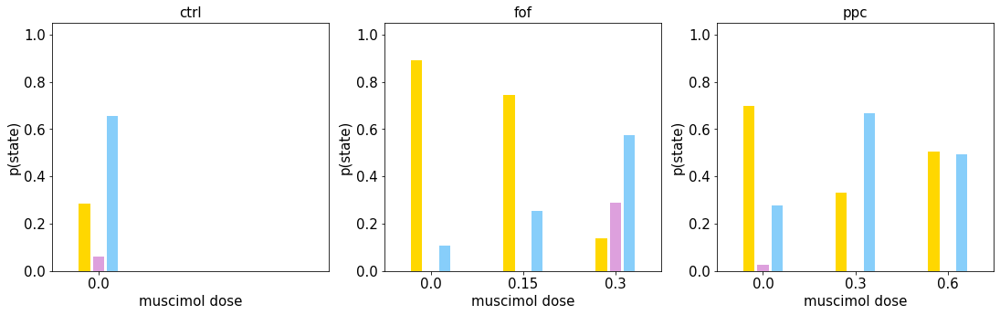

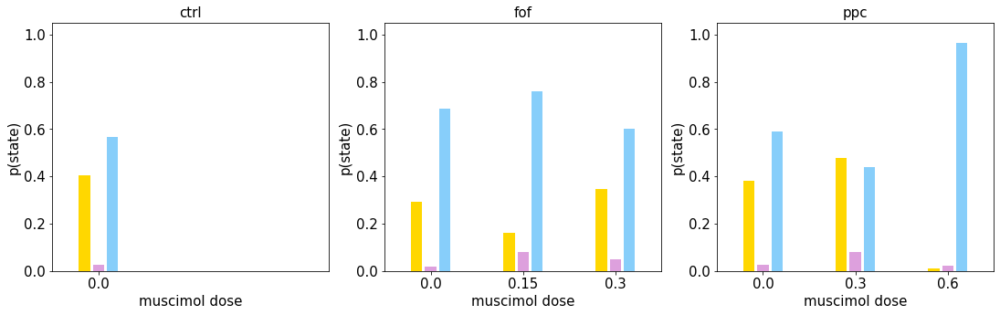

In [316]:
# fractional occupation plots
for aa in range(nanimals):
    animaldata = dataframe2test[dataframe2test.animal == animals[aa]]
    statestr = ['pstate1','pstate2','pstate3']
    regions = animaldata.region.unique()
    nregions = len(regions)
    evs = np.unique(inputs[aa][0][:,0])
    evspace = np.linspace(np.min(evs), np.max(evs), 1000)
    X = np.array([
        evspace,
        np.repeat(1, len(evspace))]).T
    transitionmatrix = np.round(transmat[aa], 2)

    fig, ax = plt.subplots(1, nregions, figsize = (25,5))
    
    for rr in range(nregions):
        regiondata = animaldata[animaldata.region == regions[rr]]
        musdoses = np.sort(regiondata.musdose.unique())
        ndoses = len(musdoses)
    
        plt.subplot(1, nregions + 1, rr + 1)
        plt.title(regions[rr], fontsize = 15)
        
        for mm in range(ndoses):
            musdosedata = regiondata[regiondata.musdose == musdoses[mm]]
            occ = musdosedata['state'].value_counts()/len(musdosedata)
            occ = occ.reindex(index = statestr)
            occ = np.nan_to_num(occ)
            
            xx = np.linspace(-.15 , .15, nstates)
            plt.bar(xx + mm, occ, color = colors, label = statestr, width = .12)
            
        # axis options
        plt.xlabel('muscimol dose',  fontsize = 15)  
        plt.ylabel('p(state)', fontsize = 15)
        plt.xticks(range(0, ndoses), musdoses)
        plt.xticks(fontsize = 15)
        plt.yticks(fontsize = 15)
        plt.xlim((-.5, 2.5))
        plt.ylim((0, 1.05))
        ax[rr].spines['top'].set_visible(False)
        ax[rr].spines['right'].set_visible(False) 

         ##saving figures
        datasetname = 'all'
        path = savepath + datasetname + '/allplots/'
        filename = str(animals[aa]) + str(str(datasetname) + '_dosefractionaloccupancy.png')
        plt.savefig(path + filename, dpi = 300, facecolor = 'white') 

In [77]:
# Big animal
inputs =  ghf.ssmBigAnimalRestructure(df, 2)[0]
Y =  ghf.ssmBigAnimalRestructure(df, 2)[1]

In [79]:
# checking best nstates fit
maxstates = 15
inputdim = 2
obsdim = 1
ncatergories = 2
niterations = 500

statell = np.zeros(maxstates)
for kk in range(maxstates):
    nstates = kk + 1
    glmhmm = ssm.HMM(nstates, obsdim, inputdim,  observations = 'input_driven_obs',
    observation_kwargs = dict(C = ncatergories), transitions = "standard")
    
    glmhmm2fit = glmhmm.fit(Y, inputs = inputs, method = 'em', num_iters = niterations, tolerance = 10**-5)

    statell[kk] = glmhmm2fit[-1]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

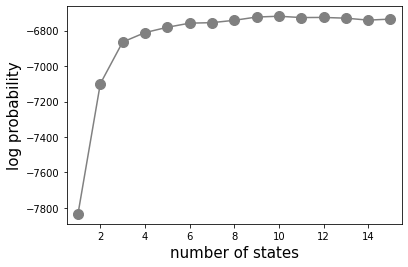

In [82]:
# plotting LL for each number of states
xx = np.arange(maxstates) + 1
plt.plot(xx, statell, marker = 'o', markersize = 10, color = 'gray', linestyle = '-')

# axis options
plt.xlabel('number of states', fontsize = 15)
plt.xlim(.5, maxstates + .5)
plt.ylabel('log probability', fontsize = 15)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False) 

##saving figures
path = savepath 
filename = 'alldata_LL_biganimal.png'
plt.savefig(path + filename, dpi = 300, facecolor = 'white') 

In [83]:
# setting glm-hmm parameters
nstates = 3
obsdim = 1
ncatergories = 2
niterations = 300

# creating new df variables for estimated states from glmhmm
df['pstate1'] = np.zeros(len(df))
df['pstate2'] = np.zeros(len(df))
df['pstate3'] = np.zeros(len(df))
df['state'] = np.zeros(len(df))

glmhmm = ssm.HMM(nstates, obsdim, inputdim,  observations = 'input_driven_obs',
            observation_kwargs = dict(C = ncatergories), transitions = "standard")
glmhmm2fit = glmhmm.fit(Y, inputs = inputs, method = 'em', num_iters = niterations, tolerance = 10**-5)

# saving the glm weights and transition matrix values
w = - glmhmm.observations.params.reshape(nstates,inputdim)
transmat = glmhmm.transitions.transition_matrix

# getting expected states
posterior_pstate = [glmhmm.expected_states(data = data, input = inputs)[0]
                    for data, inputs
                    in zip(Y, inputs)]

# saving expected states  for each trialin the data frame
ppstate_aux = np.array([item for sublist in posterior_pstate for item in sublist])
df['pstate1'] = ppstate_aux[:,0]
df['pstate2'] = ppstate_aux[:,1]
df['pstate3'] = ppstate_aux[:,2]

df.state = df[['pstate1', 'pstate2', 'pstate3']].idxmax(axis = 1)    

  0%|          | 0/300 [00:00<?, ?it/s]

In [88]:
statestr, _ = ghf.addState2df(df, nstates)

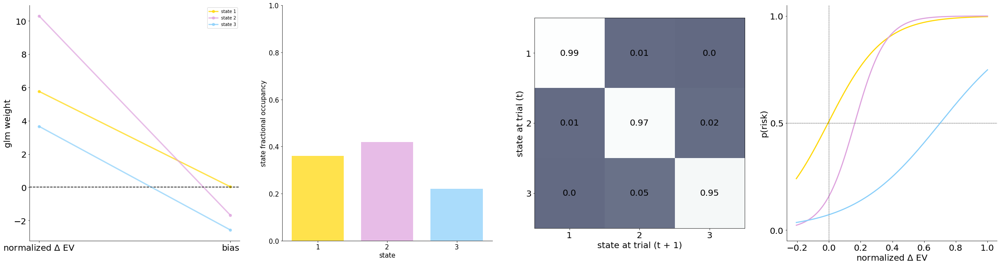

In [109]:
fig, ax = plt.subplots(1, 4, figsize = (40,10))

# getting relevant data
evs = np.unique(inputs[0][:,0])
evspace = np.linspace(np.min(evs), np.max(evs), 1000)
X = np.array([
evspace,
np.repeat(1, len(evspace))]).T

transitionmatrix = transmat

for kk in range(nstates):             
    glmweights = w[kk,:]
    wX = np.matmul(X, glmweights)

    ## plot glm weights for each covariate
    plt.subplot(1,4,1)
    plt.plot(range(inputdim), glmweights, marker = 'o', lw = 3,
             color = colors[kk], alpha = .7, linestyle = '-', label = 'state ' + str(kk+1))

    # axis options
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.ylabel('glm weight', fontsize = 20)
    plt.xticks(range(inputdim), ['normalized $\Delta$ EV ', 'bias'],  fontsize = 20)
    plt.axhline(y = 0, color = 'k', alpha = .5, ls = '--')
    plt.legend()
    ax[0].spines['top'].set_visible(False)
    ax[0].spines['right'].set_visible(False)

    ## plot fractional occupancy
    plt.subplot(1,4,2)
    occ = sum(df.state == statestr[kk])/len(df)
    plt.bar(kk, occ, width = .75, color = colors[kk], alpha = .7)

    # axis options
    plt.ylim((0,1))
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.xlabel('state', fontsize = 15)  
    plt.ylabel('state fractional occupancy', fontsize = 15)
    plt.xticks([0,1,2], ['1','2','3'], fontsize = 15)
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['right'].set_visible(False)

    ## plot transition matrix
    plt.subplot(1,4,3)
    plt.imshow(transitionmatrix, vmin = -.8, vmax = 1, cmap = 'bone')

    for jj in range(nstates):
        text = plt.text(jj, kk, str(np.round(transitionmatrix[kk, jj],2)), ha = 'center', va = 'center', color = 'k', fontsize = 20)

        plt.xlim(-.5, nstates - .5)
        plt.xticks(range(0, nstates), ('1', '2', '3'), fontsize = 20)
        plt.yticks(range(0, nstates), ('1', '2', '3'), fontsize = 20)
        plt.ylim(nstates - .5, -.5)
        plt.ylabel('state at trial (t)', fontsize = 20)
        plt.xlabel('state at trial (t + 1)', fontsize = 20)


    ## plot glm psycurves
    plt.subplot(1,4,4)
    plt.plot(evspace, expit(wX), lw = 2.5, color = colors[kk])

    # reference lines
    plt.axvline(0, linestyle = ':', c = 'k',  lw = .5)
    plt.axhline(.5, linestyle = ':', c = 'k', lw = .5)

    # axis options
    plt.ylim((-.05, 1.05))
    plt.xlabel('normalized $\Delta$ EV',  fontsize = 20)  
    plt.ylabel('p(risk)', fontsize = 20)
    ax[3].set_yticks([0, .5, 1])
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    ax[3].spines['top'].set_visible(False)
    ax[3].spines['right'].set_visible(False)
